In [1]:
from http.client import HTTPSConnection
from base64 import b64encode
import pandas as pd
import requests 
import folium 


In [2]:
#This sets up the https connection
"""c = HTTPSConnection("api.wigle.net")
#we need to base 64 encode it 
#and then decode it to acsii as python 3 stores it as a byte string
userAndPass = b64encode(b"AID1bfad74f694504ef88d11ce49b62f9e9:cdcf75f0ed077be289eb9ef2ae66413e").decode("ascii")
headers = { 'Authorization' : 'Basic %s' %  userAndPass }
PARAMS = {'latrange1':55.786868,'latrange2':55.780131, 'longrange1':12.514910, 'longrange2':12.517990 } 
#then connect
c.requests('GET', '/api/v2/network/search', params=PARAMS , headers=headers)
#get the response back
res = c.getresponse()
# at this point you could check the status etc
# this gets the page text
data = res.read()"""



  
"""# defining the api-endpoint  
API_ENDPOINT = "https://api.wigle.net/api/v2/network/search"
  
# your API key here 
userAndPass = b64encode(b"AID1bfad74f694504ef88d11ce49b62f9e9:cdcf75f0ed077be289eb9ef2ae66413e").decode("ascii")
headers = { 'Authorization' : 'Basic %s' %  userAndPass }
PARAMS = {'latrange1':55.786868,'latrange2':55.780131, 'longrange1':12.514910, 'longrange2':12.517990 } 
  
# sending post request and saving response as response object 
r = requests.get(url = API_ENDPOINT, params = PARAMS, headers=headers) 
data = r.text
print(data)"""

'# defining the api-endpoint  \nAPI_ENDPOINT = "https://api.wigle.net/api/v2/network/search"\n  \n# your API key here \nuserAndPass = b64encode(b"AID1bfad74f694504ef88d11ce49b62f9e9:cdcf75f0ed077be289eb9ef2ae66413e").decode("ascii")\nheaders = { \'Authorization\' : \'Basic %s\' %  userAndPass }\nPARAMS = {\'latrange1\':55.786868,\'latrange2\':55.780131, \'longrange1\':12.514910, \'longrange2\':12.517990 } \n  \n# sending post request and saving response as response object \nr = requests.get(url = API_ENDPOINT, params = PARAMS, headers=headers) \ndata = r.text\nprint(data)'

In [3]:
"""df = pd.read_json(data)
type(df.results)
json_results = df.results.to_json(orient='records')
pandas_results = pd.read_json(json_results)

for index,result in pandas_results.iterrows(): 
    print(result.ssid)"""
    

"df = pd.read_json(data)\ntype(df.results)\njson_results = df.results.to_json(orient='records')\npandas_results = pd.read_json(json_results)\n\nfor index,result in pandas_results.iterrows(): \n    print(result.ssid)"

In [4]:
data = pd.read_csv("DataSets/noDTU2", encoding = "ISO-8859-1") 
data

,MAC,SSID,AuthMode,FirstSeen,Channel,RSSI,CurrentLatitude,CurrentLongitude,AltitudeMeters,AccuracyMeters,Type
0,00:30:44:1c:35:2f,IBR600-52f,[WPA-PSK-CCMP][WPA2-PSK-CCMP][ESS][WPS],2018-06-07 12:24:15,11,-82,55.786276,12.521116,87.082275,3.216,WIFI
1,14:d6:4d:4b:00:46,VET-AP,[WPA-PSK-CCMP+TKIP][WPA2-PSK-CCMP+TKIP][ESS][WPS],2018-06-07 12:25:24,11,-77,55.786231,12.521193,80.832520,3.216,WIFI
2,00:78:88:99:65:7b,NaN,[WPA2-EAP-CCMP][ESS],2018-06-07 12:25:42,36,-86,55.786235,12.521208,81.856201,3.216,WIFI
3,30:74:96:6c:29:b4,HUAWEI P10 lite,[WPA2-PSK-CCMP][ESS],2018-06-07 12:25:49,1,-76,55.786216,12.521232,82.698853,3.216,WIFI
4,42:b8:9a:8a:2a:7b,DIRECT-7b-HP M477 LaserJet,[WPA2-PSK-CCMP][ESS][WPS],2018-06-07 12:25:49,1,-79,55.786216,12.521232,82.698853,3.216,WIFI
...,...,...,...,...,...,...,...,...,...,...,...
5069,00:78:88:aa:c0:8b,NaN,[WPA2-EAP-CCMP][ESS],2018-06-07 13:40:42,132,-86,55.783617,12.517039,79.070408,64.000,WIFI
5070,04:62:73:fe:a8:64,NaN,[WPA2-EAP-CCMP][ESS],2018-06-07 13:40:42,1,-84,55.783617,12.517039,79.070408,64.000,WIFI
5071,e8:65:49:11:23:eb,NaN,[WPA2-EAP-CCMP][ESS],2018-06-07 13:40:48,44,-67,55.783617,12.517039,79.019761,64.000,WIFI
5072,3a:ca:da:a1:1b:9e,Hans Jakobs iPhone,[WPA2-PSK-CCMP][ESS],2018-06-07 13:40:48,1,-98,55.783617,12.517039,79.019761,64.000,WIFI


In [5]:
wlan_map = folium.Map(
            #tiles='Stamen Toner'
        )
for index,result in data.iterrows():
    tooltip = str(result.SSID)+" - "+str(result.MAC)
    """folium.Marker([result.CurrentLatitude, result.CurrentLongitude],
                  popup=(str(result.SSID)),
                  icon=folium.Icon(color='purple', icon='wifi'),
                  tooltip=tooltip).add_to(wlan_map)"""
    folium.Circle(
        radius=3,
        location=[result.CurrentLatitude, result.CurrentLongitude],
        popup=(str(result.MAC)),
        color='purple',
        fill=True,
        tooltip=(str(result.SSID))
    ).add_to(wlan_map)

sw = data[['CurrentLatitude', 'CurrentLongitude']].min().values.tolist()
ne = data[['CurrentLatitude', 'CurrentLongitude']].max().values.tolist()
wlan_map.fit_bounds([sw, ne]) 
display(wlan_map)

In [6]:
from maclookup import ApiClient
import logging

client = ApiClient('at_S4JOtM3bMCUb36baHtB3MX8vEG1ny')

logging.basicConfig(filename='myapp.log', level=logging.WARNING)
mac = "54:c9:df:32:85:bb"
response = client.get_raw_data(mac, 'csv')

In [7]:
mac_data = pd.read_csv("DataSets/macaddress.io-db.csv", encoding = "ISO-8859-1") 
mac_data


,oui,isPrivate,companyName,companyAddress,countryCode,assignmentBlockSize,dateCreated,dateUpdated
0,60:64:A1,0,RADiflow Ltd,31 Habarzel St. Tel Aviv 6971045 IL,IL,MA-L,2013-07-29,2015-09-27
1,70:B3:D5:61:C,0,Earth Works,13-21 Saiwaityou Kofu Yamanashi 400-0857 JP,JP,MA-S,2016-12-27,2016-12-27
2,2C:B8:ED,0,Sonicwall,5455 Great America Parkway Santa Clara CA 9505...,US,MA-L,2017-12-28,2017-12-28
3,00:10:CD,0,Interface Concept,3 VENELLE de KERGOS 29000 QUIMPER FR,FR,MA-L,1997-11-14,2015-09-27
4,00:D0:E0,0,Dooin Electronics Co,"DOOIN BLDG. 16-6, SOONAE-DONG KOREA 463-020 KR",KR,MA-L,2000-11-09,2015-09-27
...,...,...,...,...,...,...,...,...
39834,8C:5F:DF,0,Beijing Railway Signal Factory,"No.2 Sicun Xilu Langfa,Huangcun, Beiijng 10261...",CN,MA-L,2011-03-17,2015-09-27
39835,84:25:DB,0,"Samsung Electronics Co, Ltd","#94-1,Imsoo-Dong Gumi Gyeongbuk 730-350 KR",KR,MA-L,2011-11-26,2015-09-27
39836,00:03:5C,0,Saint Song Corp,"4F, No. 12, Lane 94, Tsao Ti Wzi 222 TW",TW,MA-L,2000-11-09,2015-09-27
39837,00:13:4D,0,Inepro BV,Pondweg 7 Nieuw- Vennep NL,NL,MA-L,2005-01-23,2015-09-27


In [11]:
"""import csv
import itertools
import multiprocessing

mac_vendors = pd.DataFrame(columns=['mac','vendor'])
#for row in input_file:
    #print(row)

#for index,ap in data.iterrows():
    #print(ap.MAC)
def f(data):
    for index,ap in data.iterrows():
        #print(str(ap.MAC).upper())
        input_file = csv.DictReader(open("DataSets/macaddress.io-db.csv"))
        for mac_add in input_file:
            #print(str(mac_add["oui"]).upper())
            if str(mac_add["oui"]).upper() in str(ap.MAC).upper():
                print(str(ap.SSID)+" - "+str(ap.MAC)+" - "+str(mac_add["oui"])+" - "+str(mac_add["companyName"]))
                mac_vendors.loc[index] = pd.Series({'mac':ap.MAC,'oui':mac_add["oui"],'vendor':mac_add["companyName"]})
                break

#paramlist = list(itertools.product(data))
#pool = multiprocessing.Pool()
f(data)"""


            


IBR600-52f - 00:30:44:1c:35:2f - 00:30:44 - CradlePoint, Inc
VET-AP - 14:d6:4d:4b:00:46 - 14:D6:4D - D-Link International
nan - 00:78:88:99:65:7b - 00:78:88 - Cisco Systems, Inc
HUAWEI P10 lite - 30:74:96:6c:29:b4 - 30:74:96 - Huawei Tech Co, Ltd
nan - 00:c8:8b:60:87:64 - 00:C8:8B - Cisco Systems, Inc
nan - 00:c8:8b:60:87:64 - 00:C8:8B - Cisco Systems, Inc
DC_Guest - 18:33:9d:8d:bf:e1 - 18:33:9D - Cisco Systems, Inc
DC_NET - 18:33:9d:8d:bf:e0 - 18:33:9D - Cisco Systems, Inc
DC_NET - 18:33:9d:8d:bf:ef - 18:33:9D - Cisco Systems, Inc
nan - 00:c8:8b:45:a0:3b - 00:C8:8B - Cisco Systems, Inc
DC_Guest - 18:33:9d:8d:bf:ee - 18:33:9D - Cisco Systems, Inc
nan - 00:c8:8b:45:a0:34 - 00:C8:8B - Cisco Systems, Inc
DC_NET - 18:33:9d:8d:a3:f0 - 18:33:9D - Cisco Systems, Inc
nan - 00:c8:8b:45:a0:34 - 00:C8:8B - Cisco Systems, Inc
DIRECT-EF-HP OfficeJet Pro 8710 - 18:60:24:08:c1:f3 - 18:60:24 - Hewlett Packard
certifikat - a4:56:30:a2:72:94 - A4:56:30 - Cisco Systems, Inc
nan - 00:78:88:aa:b2:fb - 00:7

Satcom_Guest - 00:21:f7:11:87:89 - 00:21:F7 - Hpn Supply Chain
C-Wifi - 00:21:f7:11:87:88 - 00:21:F7 - Hpn Supply Chain
C-Wifi - 88:f0:31:ee:dd:70 - 88:F0:31 - Cisco Systems, Inc
C-Wifi - 00:21:f7:11:87:88 - 00:21:F7 - Hpn Supply Chain
HomeBox-9D80_2.4G - 54:64:d9:8b:9d:86 - 54:64:D9 - Sagemcom Broadband Sas
HUAWEI-E5180-D477-S2 - 3c:47:11:b0:d4:79 - 3C:47:11 - Huawei Tech Co, Ltd
BGANDEMO - 00:22:6b:48:7d:55 - 00:22:6B - Cisco-Linksys, Llc
HUAWEI-E5180-D477-S1 - 3c:47:11:b0:d4:78 - 3C:47:11 - Huawei Tech Co, Ltd
HUAWEI-E5180-D477-S3 - 3c:47:11:b0:d4:7a - 3C:47:11 - Huawei Tech Co, Ltd
4G Wi-Fi 3Danmark-D477 - 3c:47:11:b0:d4:77 - 3C:47:11 - Huawei Tech Co, Ltd
pfgvaerksted - d8:50:e6:dd:44:54 - D8:50:E6 - ASUSTek Computer Inc
Autonomous_Mobility_5G - 3c:46:d8:d7:fa:a3 - 3C:46:D8 - TP-Link Tech Co, Ltd
Autonomous_Mobility_2.4G - 3c:46:d8:d7:fa:a1 - 3C:46:D8 - TP-Link Tech Co, Ltd
Autonomous_Mobility_5G - 3c:46:d8:d7:fa:a3 - 3C:46:D8 - TP-Link Tech Co, Ltd
Autonomous_Mobility_2.4G - 3c:4

MEK-LANCOM - 00:a0:57:16:81:c5 - 00:A0:57 - Lancom Systems GmbH
PKS - 44:d9:e7:03:11:81 - 44:D9:E7 - Ubiquiti Networks Inc
nan - 54:78:1a:aa:8c:eb - 54:78:1A - Cisco Systems, Inc
nan - 54:78:1a:aa:8c:e4 - 54:78:1A - Cisco Systems, Inc
PF-WLAN - 94:f6:65:0e:a6:08 - 94:F6:65 - Ruckus Wireless
nan - 54:78:1a:aa:8c:e4 - 54:78:1A - Cisco Systems, Inc
MEK-LANCOM - 00:a0:57:16:82:c0 - 00:A0:57 - Lancom Systems GmbH
PF-WLAN - 94:f6:65:0e:a6:0c - 94:F6:65 - Ruckus Wireless
nan - 00:2a:10:20:c5:eb - 00:2A:10 - Cisco Systems, Inc
MEK-LANCOM - 00:a0:57:16:81:b6 - 00:A0:57 - Lancom Systems GmbH
MEK-LANCOM - 00:a0:57:16:81:b6 - 00:A0:57 - Lancom Systems GmbH
IAESTE - 00:20:a6:5b:98:e4 - 00:20:A6 - Proxim Wireless
PKS - 44:d9:e7:03:11:81 - 44:D9:E7 - Ubiquiti Networks Inc
DTIC - dc:9f:db:1c:c2:73 - DC:9F:DB - Ubiquiti Networks Inc
Xu.ed - 14:5f:94:a0:93:cc - 14:5F:94 - Huawei Tech Co, Ltd
nan - 00:2a:10:13:6e:a4 - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:20:c4:1b - 00:2A:10 - Cisco Systems, Inc
M

nan - 00:2a:10:13:7d:ab - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:c8:15:cb - 00:2A:10 - Cisco Systems, Inc
nan - 40:ce:24:dc:cd:64 - 40:CE:24 - Cisco Systems, Inc
nan - 50:0f:80:ed:71:0b - 50:0F:80 - Cisco Systems, Inc
nan - 50:0f:80:7d:b2:64 - 50:0F:80 - Cisco Systems, Inc
nan - 50:0f:80:7d:b2:44 - 50:0F:80 - Cisco Systems, Inc
nan - 00:2a:10:c8:15:cb - 00:2A:10 - Cisco Systems, Inc
nan - 50:0f:80:7d:b2:6b - 50:0F:80 - Cisco Systems, Inc
nan - 50:0f:80:75:4e:ab - 50:0F:80 - Cisco Systems, Inc
nan - 50:0f:80:75:57:ab - 50:0F:80 - Cisco Systems, Inc
nan - 00:2a:10:f3:5b:14 - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:13:7d:a4 - 00:2A:10 - Cisco Systems, Inc
nan - 5c:50:15:36:85:e4 - 5C:50:15 - Cisco Systems, Inc
nan - 00:2a:10:f3:9a:f4 - 00:2A:10 - Cisco Systems, Inc
Crestron-135bb7 iPad - 00:10:7f:13:5b:b7 - 00:10:7F - Crestron Electronics, Inc
nan - 2c:36:f8:d9:f2:2b - 2C:36:F8 - Cisco Systems, Inc
nan - 00:c8:8b:45:c6:9b - 00:C8:8B - Cisco Systems, Inc
nan - 00:2a:10:1a:fe:fb 

edunet-24 - 00:2a:10:bf:4a:35 - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:bf:4a:3f - 00:2A:10 - Cisco Systems, Inc
edunet-24 - a0:e0:af:87:a8:25 - A0:E0:AF - Cisco Systems, Inc
nan - 28:6f:7f:3a:2f:8f - 28:6F:7F - Cisco Systems, Inc
edunet-24 - a0:e0:af:a9:30:45 - A0:E0:AF - Cisco Systems, Inc
nan - bc:67:1c:1f:1c:f4 - BC:67:1C - Cisco Systems, Inc
nan - 00:c8:8b:13:c0:d4 - 00:C8:8B - Cisco Systems, Inc
nan - 00:e1:6d:a2:ea:eb - 00:E1:6D - Cisco Systems, Inc
Airport 210 - 24:a2:e1:f2:64:70 - 24:A2:E1 - Apple, Inc
Airport 210 - 24:a2:e1:f2:64:71 - 24:A2:E1 - Apple, Inc
certifikat - a4:56:30:a2:72:94 - A4:56:30 - Cisco Systems, Inc
nan - a4:56:30:a2:72:9b - A4:56:30 - Cisco Systems, Inc
i3SYNC_e235daf1 - a0:2c:36:51:b4:e0 - A0:2C:36 - FN-Link Tech Ltd
nan - 00:c8:8b:13:7d:f4 - 00:C8:8B - Cisco Systems, Inc
nan - 00:c8:8b:13:7d:fb - 00:C8:8B - Cisco Systems, Inc
nan - 00:c8:8b:26:51:64 - 00:C8:8B - Cisco Systems, Inc
edunet-24 - e4:aa:5d:14:d8:15 - E4:AA:5D - Cisco Systems, Inc
nan - a

nan - 84:3d:c6:06:1d:8b - 84:3D:C6 - Cisco Systems, Inc
nan - 84:3d:c6:06:21:5b - 84:3D:C6 - Cisco Systems, Inc
nan - 00:2a:10:f4:a8:c4 - 00:2A:10 - Cisco Systems, Inc
nan - 84:3d:c6:06:21:54 - 84:3D:C6 - Cisco Systems, Inc
nan - 00:2a:10:f4:a8:cb - 00:2A:10 - Cisco Systems, Inc
nan - 84:3d:c6:06:21:5b - 84:3D:C6 - Cisco Systems, Inc
nan - 84:3d:c6:06:21:54 - 84:3D:C6 - Cisco Systems, Inc
nan - 84:3d:c6:06:1d:84 - 84:3D:C6 - Cisco Systems, Inc
nan - 00:2a:10:f4:a8:cb - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:f4:a8:cb - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:13:7c:14 - 00:2A:10 - Cisco Systems, Inc
AndroidAP - 3c:f7:a4:c8:ed:d1 - 3C:F7:A4 - Samsung Electronics Co, Ltd
nan - 84:3d:c6:06:21:54 - 84:3D:C6 - Cisco Systems, Inc
nan - 00:2a:10:f4:a8:c4 - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:f3:aa:9b - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:f3:aa:9b - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:ca:b0:6b - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:f3:aa:94 - 00:2A:1

nan - 00:2a:10:11:31:44 - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:f3:a2:db - 00:2A:10 - Cisco Systems, Inc
nan - cc:16:7e:dd:94:6b - CC:16:7E - Cisco Systems, Inc
nan - 00:c8:8b:60:81:5b - 00:C8:8B - Cisco Systems, Inc
nan - 00:2a:10:f3:a2:db - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:13:6c:34 - 00:2A:10 - Cisco Systems, Inc
nan - cc:16:7e:dd:c7:f4 - CC:16:7E - Cisco Systems, Inc
nan - 00:2a:10:13:6b:e4 - 00:2A:10 - Cisco Systems, Inc
nan - cc:16:7e:dd:c7:fb - CC:16:7E - Cisco Systems, Inc
nan - 00:2a:10:13:6b:eb - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:f3:a2:d4 - 00:2A:10 - Cisco Systems, Inc
nan - cc:16:7e:dd:94:6b - CC:16:7E - Cisco Systems, Inc
certifikat - 00:2a:10:f4:c1:3b - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:f4:c1:34 - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:11:35:3b - 00:2A:10 - Cisco Systems, Inc
certifikat - 00:2a:10:f4:c1:3b - 00:2A:10 - Cisco Systems, Inc
nan - cc:16:7e:dd:94:64 - CC:16:7E - Cisco Systems, Inc
nan - 00:81:c4:f9:9c:9b - 00:81:C4

certifikat - 00:2a:10:f3:aa:e4 - 00:2A:10 - Cisco Systems, Inc
Modem2_5hz - d4:61:2e:50:6a:35 - D4:61:2E - Huawei Tech Co, Ltd
Modem2 - d4:61:2e:50:6a:33 - D4:61:2E - Huawei Tech Co, Ltd
nan - 84:3d:c6:06:0b:db - 84:3D:C6 - Cisco Systems, Inc
nan - 00:2a:10:f3:aa:eb - 00:2A:10 - Cisco Systems, Inc
Modem2 - d4:61:2e:50:6a:33 - D4:61:2E - Huawei Tech Co, Ltd
nan - 84:3d:c6:06:10:d4 - 84:3D:C6 - Cisco Systems, Inc
Modem2_5hz - d4:61:2e:50:6a:35 - D4:61:2E - Huawei Tech Co, Ltd
nan - 84:3d:c6:06:13:24 - 84:3D:C6 - Cisco Systems, Inc
nan - 84:3d:c6:09:fe:4b - 84:3D:C6 - Cisco Systems, Inc
certifikat - 00:2a:10:f3:aa:e4 - 00:2A:10 - Cisco Systems, Inc
nan - 84:3d:c6:44:6a:7b - 84:3D:C6 - Cisco Systems, Inc
nan - 84:3d:c6:06:13:64 - 84:3D:C6 - Cisco Systems, Inc
nan - 84:3d:c6:06:13:6b - 84:3D:C6 - Cisco Systems, Inc
nan - 84:3d:c6:44:6a:74 - 84:3D:C6 - Cisco Systems, Inc
nan - 84:3d:c6:06:13:6b - 84:3D:C6 - Cisco Systems, Inc
nan - 84:3d:c6:06:13:64 - 84:3D:C6 - Cisco Systems, Inc
nan - 00:7

Dacota N150 Router - 94:46:96:2b:89:2e - 94:46:96 - BaudTec Corp
Hiper - 24:7f:20:03:5f:a6 - 24:7F:20 - Sagemcom Broadband Sas
Little David WiFi - 80:3f:5d:58:6e:d8 - 80:3F:5D - Winstars Tech Ltd
DaddyP - 04:a1:51:31:d0:f1 - 04:A1:51 - Netgear
TP-LINK_B773 - d4:6e:0e:3f:b7:72 - D4:6E:0E - TP-Link Tech Co, Ltd
Linguini - 00:26:5a:f9:98:50 - 00:26:5A - D-Link Corp
HUAWEI-E5180-9BC2 - bc:25:e0:88:9b:c0 - BC:25:E0 - Huawei Tech Co, Ltd
dlink1 - 00:1e:58:3d:3e:a7 - 00:1E:58 - D-Link Corp
dlink - 00:26:5a:b2:1b:d0 - 00:26:5A - D-Link Corp
HUAWEI-B525-5G-D5FE - ac:07:5f:61:d6:00 - AC:07:5F - Huawei Tech Co, Ltd
? - d4:6e:0e:e6:6a:4e - D4:6E:0E - TP-Link Tech Co, Ltd
NETGEAR55 - 9c:3d:cf:01:1a:82 - 9C:3D:CF - Netgear
NETGEAR55-5G-1 - 9c:3d:cf:01:1a:83 - 9C:3D:CF - Netgear
Dacota N150 Router - 94:46:96:2b:89:2e - 94:46:96 - BaudTec Corp
Det super hurtige net - 1c:b7:2c:c1:44:70 - 1C:B7:2C - ASUSTek Computer Inc
Tenda_182150 - b8:3a:08:18:21:51 - B8:3A:08 - Tenda Tech Co, LtdDongguan branch
make

nan - 38:90:a5:08:7b:24 - 38:90:A5 - Cisco Systems, Inc
nan - 00:2a:10:f4:be:04 - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:13:71:14 - 00:2A:10 - Cisco Systems, Inc
nan - 38:90:a5:08:a4:6b - 38:90:A5 - Cisco Systems, Inc
DR650S-829655 - 00:25:42:82:96:55 - 00:25:42 - Pittasoft
nan - 38:90:a5:08:7b:24 - 38:90:A5 - Cisco Systems, Inc
nan - 38:90:a5:08:a4:6b - 38:90:A5 - Cisco Systems, Inc
nan - 38:90:a5:08:4e:64 - 38:90:A5 - Cisco Systems, Inc
nan - 00:2a:10:13:71:1b - 00:2A:10 - Cisco Systems, Inc
nan - 38:90:a5:08:a4:64 - 38:90:A5 - Cisco Systems, Inc
nan - 38:90:a5:08:7b:2b - 38:90:A5 - Cisco Systems, Inc
Macri Gato - 3c:95:09:d3:69:8d - 3C:95:09 - Liteon Tech Corp
nan - 00:2a:10:c8:16:34 - 00:2A:10 - Cisco Systems, Inc
nan - 84:3d:c6:0a:15:8b - 84:3D:C6 - Cisco Systems, Inc
Modem2 - d4:61:2e:50:6a:33 - D4:61:2E - Huawei Tech Co, Ltd
nan - 84:3d:c6:06:04:c4 - 84:3D:C6 - Cisco Systems, Inc
nan - 84:3d:c6:06:0d:54 - 84:3D:C6 - Cisco Systems, Inc
nan - 00:42:68:9c:2d:e4 - 00:42:68 - C

nan - 00:2a:10:20:d5:6b - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:f4:c0:4b - 00:2A:10 - Cisco Systems, Inc
348031 - 00:18:f8:32:be:c8 - 00:18:F8 - Cisco-Linksys, Llc
nan - 84:3d:c6:06:1e:84 - 84:3D:C6 - Cisco Systems, Inc
nan - 00:2a:10:20:d5:64 - 00:2A:10 - Cisco Systems, Inc
nan - 84:3d:c6:06:1e:8b - 84:3D:C6 - Cisco Systems, Inc
nan - cc:16:7e:dd:c3:64 - CC:16:7E - Cisco Systems, Inc
nan - 00:2a:10:f4:c1:04 - 00:2A:10 - Cisco Systems, Inc
nan - 84:3d:c6:06:1f:0b - 84:3D:C6 - Cisco Systems, Inc
nan - 00:2a:10:f4:c0:4b - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:f3:b8:c4 - 00:2A:10 - Cisco Systems, Inc
nan - 84:3d:c6:0a:1a:0b - 84:3D:C6 - Cisco Systems, Inc
nan - 84:3d:c6:06:1f:04 - 84:3D:C6 - Cisco Systems, Inc
nan - 00:2a:10:1b:14:24 - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:20:d5:6b - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:f4:c1:0b - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:f4:c0:44 - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:f4:c0:4b - 00:2A:10 - Cisco Sy

nan - fc:5b:39:68:60:64 - FC:5B:39 - Cisco Systems, Inc
nan - 00:c8:8b:11:76:24 - 00:C8:8B - Cisco Systems, Inc
PFWiFi - 78:8a:20:d5:61:01 - 78:8A:20 - Ubiquiti Networks Inc
nan - 00:c8:8b:1c:66:c4 - 00:C8:8B - Cisco Systems, Inc
PFWiFi - 78:8a:20:d5:61:01 - 78:8A:20 - Ubiquiti Networks Inc
nan - 00:c8:8b:45:bf:64 - 00:C8:8B - Cisco Systems, Inc
nan - 00:c8:8b:1c:66:cb - 00:C8:8B - Cisco Systems, Inc
nan - 00:c8:8b:45:bf:6b - 00:C8:8B - Cisco Systems, Inc
PFWiFi - 80:2a:a8:54:62:d0 - 80:2A:A8 - Ubiquiti Networks Inc
dlink - 00:19:5b:dd:67:58 - 00:19:5B - D-Link Corp
nan - 84:3d:c6:06:05:f0 - 84:3D:C6 - Cisco Systems, Inc
DR650S-829655 - 00:25:42:82:96:55 - 00:25:42 - Pittasoft
nan - 34:a8:4e:ba:92:44 - 34:A8:4E - Cisco Systems, Inc
nan - 00:c8:8b:11:76:e4 - 00:C8:8B - Cisco Systems, Inc
PRG2 - 6c:b0:ce:f7:be:62 - 6C:B0:CE - Netgear
Bedrebustur - 00:24:21:44:c3:38 - 00:24:21 - Micro-Star Int'L Co, Ltd
Xu.ed - 14:5f:94:a0:93:cc - 14:5F:94 - Huawei Tech Co, Ltd
PF-WLAN - 94:f6:65:0e:a6:08

K-Net - f0:9f:c2:f1:df:2c - F0:9F:C2 - Ubiquiti Networks Inc
Mikkelsen Public - 88:1f:a1:45:35:75 - 88:1F:A1 - Apple, Inc
K-Net - f0:9f:c2:f1:de:8c - F0:9F:C2 - Ubiquiti Networks Inc
EAGLE31F38F - 34:21:09:31:f3:8f - 34:21:09 - Jensen Scandinavia AS
No connection - 30:b5:c2:36:ec:75 - 30:B5:C2 - TP-Link Tech Co, Ltd
TDC-6600 - 00:19:70:34:4d:1e - 00:19:70 - Z-Com, Inc
Latt - bc:ee:7b:c4:c4:e8 - BC:EE:7B - ASUSTek Computer Inc
var - 2c:56:dc:4f:ff:a9 - 2C:56:DC - ASUSTek Computer Inc
bin - 2c:56:dc:4f:ff:a8 - 2C:56:DC - ASUSTek Computer Inc
dlink1 - 00:1e:58:3d:3e:a7 - 00:1E:58 - D-Link Corp
Linguini - 00:26:5a:f9:98:50 - 00:26:5A - D-Link Corp
NETGEAR14 - 8c:3b:ad:13:94:f3 - 8C:3B:AD - Netgear
EAGLE31F38F - 34:21:09:31:f3:8f - 34:21:09 - Jensen Scandinavia AS
TDC-6600 - 00:19:70:34:4d:1e - 00:19:70 - Z-Com, Inc
ASUS_MM_5G - 30:5a:3a:70:ac:34 - 30:5A:3A - ASUSTek Computer Inc
K-Net - f0:9f:c2:f1:e3:89 - F0:9F:C2 - Ubiquiti Networks Inc
Quantum 5GHz - 74:da:da:35:9e:c3 - 74:DA:DA - D-Lin

Little David WiFi - 80:3f:5d:58:6e:d8 - 80:3F:5D - Winstars Tech Ltd
Latt - bc:ee:7b:c4:c4:e8 - BC:EE:7B - ASUSTek Computer Inc
nan - 84:3d:c6:0a:07:a4 - 84:3D:C6 - Cisco Systems, Inc
DTUKEMI - a4:2b:8c:02:f5:20 - A4:2B:8C - Netgear
TEN Wi-Fi Network - 80:ea:96:f3:95:36 - 80:EA:96 - Apple, Inc
ASC007_2.4Ghz - d4:6e:0e:36:de:45 - D4:6E:0E - TP-Link Tech Co, Ltd
nan - 00:2a:10:f4:bd:d4 - 00:2A:10 - Cisco Systems, Inc
nan - 84:3d:c6:37:30:64 - 84:3D:C6 - Cisco Systems, Inc
nan - 84:3d:c6:7a:2c:54 - 84:3D:C6 - Cisco Systems, Inc
nan - 84:3d:c6:06:0f:d4 - 84:3D:C6 - Cisco Systems, Inc
nan - 84:3d:c6:0a:1a:54 - 84:3D:C6 - Cisco Systems, Inc
nan - 00:2a:10:13:7c:14 - 00:2A:10 - Cisco Systems, Inc
nan - 00:78:88:99:5f:fb - 00:78:88 - Cisco Systems, Inc
nan - 00:2a:10:1b:00:04 - 00:2A:10 - Cisco Systems, Inc
nan - 00:78:88:ad:a5:04 - 00:78:88 - Cisco Systems, Inc
nan - 00:78:88:92:97:54 - 00:78:88 - Cisco Systems, Inc
nan - 00:2a:10:f4:be:14 - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:1b:0f:

K-Net - f0:9f:c2:f1:e0:80 - F0:9F:C2 - Ubiquiti Networks Inc
K-Net - f0:9f:c2:f1:db:64 - F0:9F:C2 - Ubiquiti Networks Inc
PDore - 94:46:96:2b:7d:3b - 94:46:96 - BaudTec Corp
AirPort Express Kvædevej 57 - 68:a8:6d:5f:55:bf - A8:6D:5F - Raisecom Tech Co, Ltd
Sparkle - 18:d6:c7:fb:cd:e6 - 18:D6:C7 - TP-Link Tech Co, Ltd
sriracha - 00:1a:2a:97:f7:3e - 00:1A:2A - Arcadyan Tech Corp
TP-LINK_158E - 50:c7:bf:c1:15:8e - 50:C7:BF - TP-Link Tech Co, Ltd
Ovenpaa - 00:24:b2:5b:1b:e0 - 00:24:B2 - Netgear
NETGEAR99 - b0:39:56:8b:cb:7e - B0:39:56 - Netgear
TOTOLINK A1004 - f4:28:53:7f:58:c4 - F4:28:53 - Zioncom Electronics (Shenzhen) Ltd
Awesome Nikolajs hempel WIFI - ac:cf:85:95:4f:2a - AC:CF:85 - Huawei Tech Co, Ltd
HLAN - 34:ce:00:2f:bb:b2 - 34:CE:00 - Xiaomi Electronics, Co, Ltd
Xusong's wifi - c8:3a:35:0e:9b:c0 - C8:3A:35 - Tenda Tech Co, Ltd
SDC - 50:64:2b:7c:3c:83 - 50:64:2B - Xiaomi Electronics, Co, Ltd
tpwlan - d8:15:0d:5d:a7:c6 - D8:15:0D - TP-Link Tech Co, Ltd
Awesome Nikolajs hempel WIFI -

E1_11 - 14:91:82:a9:fd:1a - 14:91:82 - Belkin International Inc
TOTOLINK A1004 - f4:28:53:7f:58:c4 - F4:28:53 - Zioncom Electronics (Shenzhen) Ltd
TOTOLINK A1004_5G - f4:28:53:7f:58:c6 - F4:28:53 - Zioncom Electronics (Shenzhen) Ltd
TP-LINK_38BE - 50:bd:5f:76:38:be - 50:BD:5F - TP-Link Tech Co, Ltd
Sincerely_ allzero - 90:9f:33:b1:12:a6 - 90:9F:33 - Efm Networks
Marcia Brinck 2.4GHz - 60:a4:4c:27:8d:80 - 60:A4:4C - ASUSTek Computer Inc
TP-Link_DB32 - 7c:8b:ca:82:db:32 - 7C:8B:CA - TP-Link Tech Co, Ltd
kianooshh - 6c:3b:6b:31:39:07 - 6C:3B:6B - Routerboard.com
HUAWEI-ZRSEP7 - c8:94:bb:0f:db:c0 - C8:94:BB - Huawei Tech Co, Ltd
ZyXEL - 10:7b:ef:db:05:15 - 10:7B:EF - Zyxel Communications Corp
iptime5G - 00:26:66:c5:f8:f8 - 00:26:66 - Efm Networks
NETGEAR - c0:3f:0e:19:c5:c2 - C0:3F:0E - Netgear
TP-LINK_683975 - 30:b4:9e:68:39:75 - 30:B4:9E - TP-Link Tech Co, Ltd
1001A - 70:4f:57:5a:77:48 - 70:4F:57 - TP-Link Tech Co, Ltd
6111 - 00:26:66:c5:f8:fc - 00:26:66 - Efm Networks
R8 Good - b0:6e:bf

ASUS_6C - 10:7b:44:b5:ad:6c - 10:7B:44 - ASUSTek Computer Inc
B-6 - ec:08:6b:8a:3c:24 - EC:08:6B - TP-Link Tech Co, Ltd
Thomsen_2G - 70:4f:57:da:31:5f - 70:4F:57 - TP-Link Tech Co, Ltd
TP-LINK_90A3 - 98:de:d0:38:90:a3 - 98:DE:D0 - TP-Link Tech Co, Ltd
TP-LINK_8BD9 - b0:95:8e:61:8b:d9 - B0:95:8E - TP-Link Tech Co, Ltd
WiFi Cutaaaay - 00:1e:a6:b6:74:b0 - 00:1E:A6 - Best IT World (India) Pvt. Ltd
B-6 - ec:08:6b:8a:3c:24 - EC:08:6B - TP-Link Tech Co, Ltd
TP-LINK_90A3 - 98:de:d0:38:90:a3 - 98:DE:D0 - TP-Link Tech Co, Ltd
MindKey-5G - a0:63:91:e9:00:d9 - A0:63:91 - Netgear
MedtraceA_5G-2 - 34:97:f6:51:74:08 - 34:97:F6 - ASUSTek Computer Inc
TP-LINK_90A2_5G - 98:de:d0:38:90:a2 - 98:DE:D0 - TP-Link Tech Co, Ltd
TP-LINK_90A3 - 98:de:d0:38:90:a3 - 98:DE:D0 - TP-Link Tech Co, Ltd
MERCURY_D3C424 - c8:e7:d8:d3:c4:24 - C8:E7:D8 - Mercury Communication Tech Co, Ltd
Croissant - fc:f5:28:fe:ee:10 - FC:F5:28 - Zyxel Communications Corp
MedtraceA_5G - 34:97:f6:51:74:04 - 34:97:F6 - ASUSTek Computer Inc
H

nan - 00:2a:10:11:34:cb - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:13:6c:24 - 00:2A:10 - Cisco Systems, Inc
WaveLAN IAU - 00:20:b0:11:f9:a8 - 00:20:B0 - Gateway Devices, Inc
WaveLAN IAU - 00:20:b0:11:f9:a8 - 00:20:B0 - Gateway Devices, Inc
nan - 00:2a:10:13:6c:24 - 00:2A:10 - Cisco Systems, Inc
hexacopter3 - b8:27:eb:87:bb:f2 - B8:27:EB - Raspberry Pi Foundation
WaveLAN IAU - 00:20:b0:11:f9:a8 - 00:20:B0 - Gateway Devices, Inc
Clickshare-208 - 80:2a:a8:8a:13:a3 - 80:2A:A8 - Ubiquiti Networks Inc
WaveLAN IAU - 00:19:5b:b0:d8:b0 - 00:19:5B - D-Link Corp
WaveLAN IAU - 00:19:5b:b0:d8:b0 - 00:19:5B - D-Link Corp
nan - 00:2a:10:13:70:7b - 00:2A:10 - Cisco Systems, Inc
i3SYNC_4dccd512 - 58:63:56:d7:9d:6c - 58:63:56 - FN-Link Tech Ltd
nan - 00:2a:10:13:6c:0b - 00:2A:10 - Cisco Systems, Inc
BeagleBone-CD5A - f4:5e:ab:f8:cd:5a - F4:5E:AB - Texas Instruments
BeagleBone-CD5A - f4:5e:ab:f8:cd:5a - F4:5E:AB - Texas Instruments
nan - 00:2a:10:13:70:74 - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:1

nan - 10:bf:48:d3:9c:e8 - 10:BF:48 - ASUSTek Computer Inc
HUAWEI-B5JCAU - 14:a5:1a:b1:5a:58 - 14:A5:1A - Huawei Tech Co, Ltd
i3SYNC_cd125038 - 58:63:56:d7:c6:3a - 58:63:56 - FN-Link Tech Ltd
nan - 00:2a:10:1a:fc:cb - 00:2A:10 - Cisco Systems, Inc
Nilotech-2.4 - 10:62:eb:99:0c:44 - 10:62:EB - D-Link International
nan - 00:27:0d:8b:4f:43 - 00:27:0D - Cisco Systems, Inc
daisy - 14:dd:a9:c9:73:e8 - 14:DD:A9 - ASUSTek Computer Inc
Sitemorse - 00:02:cf:8d:9b:9e - 00:02:CF - ZyGate Communications, Inc
daisy - 14:dd:a9:c9:73:e8 - 14:DD:A9 - ASUSTek Computer Inc
NILT - d8:30:62:36:d2:75 - D8:30:62 - Apple, Inc
stealth5_guest - 10:bf:48:d3:9c:ed - 10:BF:48 - ASUSTek Computer Inc
DTU Science Park - 00:27:0d:8b:4f:40 - 00:27:0D - Cisco Systems, Inc
nan - 00:27:0d:8b:4f:41 - 00:27:0D - Cisco Systems, Inc
Internal - 00:27:0d:48:b5:62 - 00:27:0D - Cisco Systems, Inc
DTU Science Park - 00:27:0d:8b:4f:4f - 00:27:0D - Cisco Systems, Inc
CEKO - 10:c3:7b:c5:d1:5c - 10:C3:7B - ASUSTek Computer Inc
DTU Scie

dlink-A3C0 - 70:62:b8:62:a3:c0 - 70:62:B8 - D-Link International
K-Net - 2c:41:38:f1:3b:b0 - 2C:41:38 - Hewlett Packard
NETGEAR57 - 08:02:8e:99:e4:12 - 08:02:8E - Netgear
377dw6 - 10:da:43:08:b7:5a - 10:DA:43 - Netgear
Lars Bybergs Netværk - b8:c7:5d:0b:33:6a - B8:C7:5D - Apple, Inc
LEDERSKAB - 28:c6:8e:6e:39:a2 - 28:C6:8E - Netgear
BM - 9c:3d:cf:69:01:6e - 9C:3D:CF - Netgear
NETGEAR27-5G - a0:04:60:a1:fe:cc - A0:04:60 - Netgear
1st Mile - 1c:7e:e5:4b:12:8e - 1C:7E:E5 - D-Link International
NETGEAR27 - a0:04:60:a1:fe:c8 - A0:04:60 - Netgear
Fluidan - 94:10:3e:93:c9:9b - 94:10:3E - Belkin International Inc
NETGEAR66 - 20:4e:7f:5a:df:81 - 20:4E:7F - Netgear
B202 - 20:4e:7f:6e:cd:18 - 20:4E:7F - Netgear
Cortex-2.4GHz - 6c:19:8f:cc:29:b0 - 6C:19:8F - D-Link International
nan - 00:27:0d:8a:eb:a1 - 00:27:0D - Cisco Systems, Inc
NETGEAR35-5G - dc:ef:09:b2:d3:cd - DC:EF:09 - Netgear
NETGEAR66-5G - 20:4e:7f:5a:df:83 - 20:4E:7F - Netgear
mobiLAB - e0:91:f5:db:56:24 - E0:91:F5 - Netgear
BM - 9c:3

RetuneDSP - 08:62:66:8b:1d:98 - 08:62:66 - ASUSTek Computer Inc
PreSeed Ventures - d8:38:fc:b8:e5:8c - D8:38:FC - Ruckus Wireless
HP-Print-14-Officejet Pro 8620 - fc:3f:db:71:a1:14 - FC:3F:DB - Hewlett Packard
CederRar - 58:ef:68:28:9c:2c - 58:EF:68 - Belkin International Inc
Daintel - 1c:b7:2c:86:9e:88 - 1C:B7:2C - ASUSTek Computer Inc
Dacota AC1200 Router-2.4G - 74:da:38:cd:04:f0 - 74:DA:38 - Edimax Tech Co Ltd
Seedcapital - e0:1c:41:d2:2e:d4 - E0:1C:41 - Extreme Networks, Inc
VPSolutions - 70:73:cb:b5:0f:ab - 70:73:CB - Apple, Inc
Similix - 70:4d:7b:94:cb:60 - 70:4D:7B - ASUSTek Computer Inc
5te - 1c:b7:2c:86:9e:80 - 1C:B7:2C - ASUSTek Computer Inc
RetuneDSP - 08:62:66:8b:1d:98 - 08:62:66 - ASUSTek Computer Inc
Dacota AC1200 Router-2.4G - 74:da:38:cd:04:f0 - 74:DA:38 - Edimax Tech Co Ltd
Seedcapital - e0:1c:41:d2:2e:d4 - E0:1C:41 - Extreme Networks, Inc
Similix - 70:4d:7b:94:cb:60 - 70:4D:7B - ASUSTek Computer Inc
PreSeed Ventures Guest - d8:38:fc:f8:e5:0c - D8:38:FC - Ruckus Wirele

K-Net - 00:24:a8:b5:50:90 - 00:24:A8 - ProCurve Networking by HP
BioPhero2-5GHz - 74:da:da:4a:51:be - 74:DA:DA - D-Link International
nan - 00:27:0d:8a:eb:a3 - 00:27:0D - Cisco Systems, Inc
DR-Licensvogn - e8:de:27:bb:6e:fc - E8:DE:27 - TP-Link Tech Co, Ltd
nan - 00:27:0d:8b:4d:71 - 00:27:0D - Cisco Systems, Inc
K-Net - 00:24:a8:b5:50:30 - 00:24:A8 - ProCurve Networking by HP
cphnano_production_5G - 10:62:eb:e1:42:c0 - 10:62:EB - D-Link International
cphnano-5GHz - a0:ab:1b:f2:e2:4a - A0:AB:1B - D-Link International
BioPhero2 - 74:da:da:4a:51:bc - 74:DA:DA - D-Link International
K-Net - 00:24:a8:b5:50:30 - 00:24:A8 - ProCurve Networking by HP
cphnano - a0:ab:1b:f2:e2:48 - A0:AB:1B - D-Link International
Xiaomi_FFC4 - f0:b4:29:fc:6b:d1 - F0:B4:29 - Xiaomi Communications Co Ltd
K-Net - 00:24:a8:b5:02:b0 - 00:24:A8 - ProCurve Networking by HP
K-Net - a0:48:1c:4b:46:10 - A0:48:1C - Hewlett Packard
WDK_118A - 70:4d:7b:0c:93:00 - 70:4D:7B - ASUSTek Computer Inc
B737 - 58:ef:68:b6:68:2f - 58:

Waves Kontor WiFi-Network - 80:ea:96:eb:be:99 - 80:EA:96 - Apple, Inc
Ampersand_5Ghz - 60:38:e0:dc:46:25 - 60:38:E0 - Belkin International Inc
NETGEAR85 - c0:ff:d4:b0:a9:f3 - C0:FF:D4 - Netgear
DTU Science Park - 00:27:0d:8b:50:2f - 00:27:0D - Cisco Systems, Inc
Internal - 00:27:0d:8b:50:2d - 00:27:0D - Cisco Systems, Inc
Centrifuge - 28:10:7b:4d:fa:50 - 28:10:7B - D-Link International
DTU Science Park Guest - 00:27:0d:8b:50:2b - 00:27:0D - Cisco Systems, Inc
Waves Kontor WiFi-Network - 80:ea:96:eb:be:98 - 80:EA:96 - Apple, Inc
LITEHAUZ - 6c:70:9f:e1:bc:c8 - 6C:70:9F - Apple, Inc
Danfoss - 34:fc:b9:0b:c6:11 - 34:FC:B9 - Hewlett Packard Enterprise
DanfossScion - 58:ef:68:0c:f1:e4 - 58:EF:68 - Belkin International Inc
nan - a4:2b:b0:f6:2e:ba - A4:2B:B0 - TP-Link Tech Co, Ltd
nan - a4:2b:b0:f6:2e:bb - A4:2B:B0 - TP-Link Tech Co, Ltd
Danfoss - 34:fc:b9:e6:fa:a1 - 34:FC:B9 - Hewlett Packard Enterprise
Siemens Wildcat - 64:70:02:78:a9:6e - 64:70:02 - TP-Link Tech Co, Ltd
Ampersand - 60:38:e0

Siemens Wildcat - 64:70:02:78:a9:6e - 64:70:02 - TP-Link Tech Co, Ltd
LPS WLAN - a0:04:60:a2:15:60 - A0:04:60 - Netgear
Siemens - 58:6d:8f:2c:75:c0 - 58:6D:8F - Cisco-Linksys, Llc
AirPort Extreme - 90:72:40:17:57:62 - 90:72:40 - Apple, Inc
BioPhero - a0:ab:1b:87:86:2c - A0:AB:1B - D-Link International
MuldeBerg - 28:37:37:43:fb:2e - 28:37:37 - Apple, Inc
nan - e8:65:d4:35:fa:31 - E8:65:D4 - Tenda Tech Co, LtdDongguan branch
A224 - 34:21:09:19:0f:e0 - 34:21:09 - Jensen Scandinavia AS
Skybox2 - 38:4b:76:02:70:83 - 38:4B:76 - Airtame ApS
BioPhero-5GHz_2GEXT - a0:40:a0:8a:d8:70 - A0:40:A0 - Netgear
daisy - 14:dd:a9:c9:73:e8 - 14:DD:A9 - ASUSTek Computer Inc
Skybox2 - 38:4b:76:02:70:82 - 38:4B:76 - Airtame ApS
KNXsolutions - bc:f6:85:c0:92:6c - BC:F6:85 - D-Link International
B202 - 20:4e:7f:6e:cd:18 - 20:4E:7F - Netgear
Telco_net_5GHz - b0:c7:45:7d:f3:ec - B0:C7:45 - Buffalo.Inc
BADASSUS - 30:5a:3a:51:01:e8 - 30:5A:3A - ASUSTek Computer Inc
nan - 00:c8:8b:60:82:4b - 00:C8:8B - Cisco System

P36 - c0:25:e9:e0:ef:dc - C0:25:E9 - TP-Link Tech Co, Ltd
AJK - 00:22:6b:7b:2a:81 - 00:22:6B - Cisco-Linksys, Llc
FBI Surveillance Van - 00:1d:7e:bc:42:85 - 00:1D:7E - Cisco-Linksys, Llc
810 - bc:ee:7b:56:6d:74 - BC:EE:7B - ASUSTek Computer Inc
Bodellet - 00:18:e7:e2:ea:70 - 00:18:E7 - Cameo Communications, Inc
Jepsen - 64:66:b3:fc:df:6c - 64:66:B3 - TP-Link Tech Co, Ltd
Totalforvirring - 30:b5:c2:8d:dd:91 - 30:B5:C2 - TP-Link Tech Co, Ltd
DenSorteBox - 08:02:8e:e2:6d:d4 - 08:02:8E - Netgear
DIRECT-9A-HP OfficeJet Pro 8710 - c8:d3:ff:88:da:9b - C8:D3:FF - Hewlett Packard
Thilker_WAN_G2 - 20:cf:30:ce:34:a9 - 20:CF:30 - ASUSTek Computer Inc
dlink-23F8 - 80:26:89:74:23:f8 - 80:26:89 - D-Link International
Rambøll - b0:4e:26:5e:ae:84 - B0:4E:26 - TP-Link Tech Co, Ltd
Mit sande jeg - c4:67:b5:10:75:e3 - C4:67:B5 - Libratone A/S
Totalforvirring - 30:b5:c2:8d:dd:91 - 30:B5:C2 - TP-Link Tech Co, Ltd
nan - 00:78:88:99:5a:c4 - 00:78:88 - Cisco Systems, Inc
RED - a0:f3:c1:cd:38:9e - A0:F3:C1 - TP

ClickShare-9714071226 - 00:0e:8e:3b:22:92 - 00:0E:8E - SparkLAN Communications, Inc
nan - 64:a0:e7:28:a3:5b - 64:A0:E7 - Cisco Systems, Inc
DIRECT-D6-HP DeskJet 3700 series - 80:ce:62:6e:2f:d8 - 80:CE:62 - Hewlett Packard
HUAWEI-E5170-8C8E - 90:4e:2b:5b:8c:8e - 90:4E:2B - Huawei Tech Co, Ltd
nan - 00:2a:10:13:71:54 - 00:2A:10 - Cisco Systems, Inc
nan - fc:5b:39:69:e2:04 - FC:5B:39 - Cisco Systems, Inc
nan - 00:2a:10:f3:aa:2b - 00:2A:10 - Cisco Systems, Inc
nan - 00:2a:10:13:6f:c4 - 00:2A:10 - Cisco Systems, Inc
nan - 84:3d:c6:06:1e:44 - 84:3D:C6 - Cisco Systems, Inc
nan - 00:2a:10:11:32:04 - 00:2A:10 - Cisco Systems, Inc
nan - 84:3d:c6:0a:00:24 - 84:3D:C6 - Cisco Systems, Inc
nan - 00:2a:10:13:71:44 - 00:2A:10 - Cisco Systems, Inc
TP-LINK_22B028 - 30:b5:c2:22:b0:28 - 30:B5:C2 - TP-Link Tech Co, Ltd
ZyXELFC2060 - 28:28:5d:fc:20:60 - 28:28:5D - Zyxel Communications Corp
eduroam_2.4G - 8c:a6:df:2f:54:b2 - 8C:A6:DF - TP-Link Tech Co, Ltd
Gær1 - 00:16:fb:ba:95:a4 - 00:16:FB - Shenzhen Mtc C

TDC-F40C - 00:19:70:83:ed:48 - 00:19:70 - Z-Com, Inc
K-Net - 8c:dc:d4:99:01:50 - 8C:DC:D4 - Hewlett Packard
Krenk - 00:25:9c:34:97:24 - 00:25:9C - Cisco-Linksys, Llc
PG - e0:91:f5:70:ed:a0 - E0:91:F5 - Netgear
NETGEAR72 - 80:37:73:f8:8e:00 - 80:37:73 - Netgear
NorthCarolina - 54:04:a6:8f:dc:5a - 54:04:A6 - ASUSTek Computer Inc
NETGEAR47 - a0:04:60:9f:dc:78 - A0:04:60 - Netgear
Koden er ikke password - 50:c7:bf:1e:4b:0e - 50:C7:BF - TP-Link Tech Co, Ltd
TP-LINK_C2B33C - 30:b5:c2:c2:b3:3c - 30:B5:C2 - TP-Link Tech Co, Ltd
Struck Guest 24G - 54:a0:50:e5:4a:21 - 54:A0:50 - ASUSTek Computer Inc
PrettyFly4AWiFi - 60:45:cb:8c:d3:c0 - 60:45:CB - ASUSTek Computer Inc
dlink-4344 - e4:6f:13:f9:43:44 - E4:6F:13 - D-Link International
Krenk - 00:25:9c:34:97:24 - 00:25:9C - Cisco-Linksys, Llc
NETGEAR72 - 80:37:73:f8:8e:00 - 80:37:73 - Netgear
NETGEAR47 - a0:04:60:9f:dc:78 - A0:04:60 - Netgear
Koden er ikke password - 50:c7:bf:1e:4b:0e - 50:C7:BF - TP-Link Tech Co, Ltd
Struck Guest 24G - 54:a0:50:e5:

LuckyWifi - 08:02:8e:99:e2:cc - 08:02:8E - Netgear
!TheFirstOneOnTheList - 70:62:b8:63:fa:30 - 70:62:B8 - D-Link International
ZyXEL NBG-418N v2 - 10:7b:ef:ff:08:07 - 10:7B:EF - Zyxel Communications Corp
OnNetworks03 - 20:e5:2a:50:ba:78 - 20:E5:2A - Netgear
dlink-0A88 - a0:ab:1b:85:0a:88 - A0:AB:1B - D-Link International
TP-LINK_221C_5G - 50:c7:bf:52:22:1b - 50:C7:BF - TP-Link Tech Co, Ltd
Videnskabsteori - 10:fe:ed:f5:12:00 - 10:FE:ED - TP-Link Tech Co, Ltd
RouterOfRohan - e8:94:f6:c7:a7:e8 - E8:94:F6 - TP-Link Tech Co, Ltd
ItHurtsWhenIP_2.4 - 70:4f:57:8a:ae:47 - 70:4F:57 - TP-Link Tech Co, Ltd
Sheik_Fayes 2.4GhZ - 60:e3:27:af:fb:98 - 60:E3:27 - TP-Link Tech Co, Ltd
Thomas 3410 - e0:3f:49:07:e8:78 - E0:3F:49 - ASUSTek Computer Inc
dlink-E228 - 1c:5f:2b:10:e2:28 - 1C:5F:2B - D-Link International
TP-LINK_221C - 50:c7:bf:52:22:1c - 50:C7:BF - TP-Link Tech Co, Ltd
bobby - 74:da:da:fb:d0:b8 - 74:DA:DA - D-Link International
ZyXEL NBG-418N v2 - 10:7b:ef:ff:08:07 - 10:7B:EF - Zyxel Communica

TP-LINK_4182 - 50:c7:bf:23:41:82 - 50:C7:BF - TP-Link Tech Co, Ltd
No lan for old men - b0:39:56:8b:ea:c8 - B0:39:56 - Netgear
TP-LINK_9545E6 - 98:de:d0:95:45:e6 - 98:DE:D0 - TP-Link Tech Co, Ltd
Room3001 - c0:3f:0e:7d:42:5f - C0:3F:0E - Netgear
ItHurtsWhenIP_2.4 - 70:4f:57:8a:ae:47 - 70:4F:57 - TP-Link Tech Co, Ltd
ItHurtsWhenIP_5 - 70:4f:57:8a:ae:46 - 70:4F:57 - TP-Link Tech Co, Ltd
PutPlug - e0:91:f5:cc:de:53 - E0:91:F5 - Netgear
K-Net - a0:d3:c1:a3:be:f0 - A0:D3:C1 - Hewlett Packard
Moms spaghetti - 64:66:b3:54:e2:3d - 64:66:B3 - TP-Link Tech Co, Ltd
ZyXEL NBG-418N v2 - e8:37:7a:87:52:e9 - E8:37:7A - Zyxel Communications Corp
NETGEAR92 - a0:04:60:03:e1:60 - A0:04:60 - Netgear
K-Net - a0:d3:c1:a3:ba:b0 - A0:D3:C1 - Hewlett Packard
K-Net - a0:d3:c1:a3:c8:10 - A0:D3:C1 - Hewlett Packard
K-Net - a0:d3:c1:a3:be:e0 - A0:D3:C1 - Hewlett Packard
K-Net - a0:d3:c1:a3:c8:00 - A0:D3:C1 - Hewlett Packard
K-Net - a0:d3:c1:a3:ba:60 - A0:D3:C1 - Hewlett Packard
K-Net - a0:d3:c1:ac:17:60 - A0:D3:C1

NETGEAR - 20:4e:7f:08:52:e6 - 20:4E:7F - Netgear
K-Net - a0:d3:c1:a3:c8:70 - A0:D3:C1 - Hewlett Packard
Kaspernet_5G - 2c:56:dc:4f:cd:34 - 2C:56:DC - ASUSTek Computer Inc
Sommernet - a0:ab:1b:54:99:d0 - A0:AB:1B - D-Link International
Rashid Rayhan Abdurrahman - 84:c9:b2:aa:10:76 - 84:C9:B2 - D-Link International
Sommernet (5GHz) - a0:ab:1b:54:99:d2 - A0:AB:1B - D-Link International
Underberg - a4:2b:b0:f6:15:92 - A4:2B:B0 - TP-Link Tech Co, Ltd
LIETUVA - c8:b3:73:57:7d:74 - C8:B3:73 - Cisco-Linksys, Llc
Underberg - a4:2b:b0:f6:15:92 - A4:2B:B0 - TP-Link Tech Co, Ltd
RedFox - 00:11:32:53:50:1b - 00:11:32 - Synology Inc
Vallis Crib - 2c:b0:5d:39:54:4f - 2C:B0:5D - Netgear
NETGEAR63 - 84:1b:5e:e7:f7:3c - 84:1B:5E - Netgear
Lord Westh - 1c:5f:2b:fd:57:90 - 1C:5F:2B - D-Link International
K-Net - a0:d3:c1:ac:17:70 - A0:D3:C1 - Hewlett Packard
dlink-C0E3 - c0:a0:bb:ea:c0:e3 - C0:A0:BB - D-Link International
Club Pengiun Secret Headquarters - e0:3f:49:6a:02:f8 - E0:3F:49 - ASUSTek Computer I

K-Net - a0:d3:c1:ac:17:00 - A0:D3:C1 - Hewlett Packard
K-Net - a0:d3:c1:ac:18:30 - A0:D3:C1 - Hewlett Packard
ORBI09 - 08:02:8e:8a:b7:c9 - 08:02:8E - Netgear
MPower24 - c8:d7:19:91:46:c7 - C8:D7:19 - Cisco-Linksys, Llc
Internettet - 34:21:09:31:f8:72 - 34:21:09 - Jensen Scandinavia AS
DIRECT-A2-HP ENVY 4520 series - 18:60:24:d6:c9:a3 - 18:60:24 - Hewlett Packard
NETGEAR80 - e4:f4:c6:4e:68:ec - E4:F4:C6 - Netgear
GLE13 - 18:31:bf:67:98:88 - 18:31:BF - ASUSTek Computer Inc
Dit_Nortec_Vaskeri - 60:e3:27:2d:5a:48 - 60:E3:27 - TP-Link Tech Co, Ltd
KK1502-v1 - a0:63:91:03:11:a8 - A0:63:91 - Netgear
304 - 34:21:09:2d:99:c8 - 34:21:09 - Jensen Scandinavia AS
Stealth - 70:8b:cd:87:07:a0 - 70:8B:CD - ASUSTek Computer Inc
Chewiebacca - c8:be:19:73:63:80 - C8:BE:19 - D-Link International
Broge-nettet - 94:46:96:2b:c7:2b - 94:46:96 - BaudTec Corp
Frit! - 54:b8:0a:f6:86:e4 - 54:B8:0A - D-Link International
It hurts when IP - 2.4GHz - 38:d5:47:43:d6:e8 - 38:D5:47 - ASUSTek Computer Inc
0403 - 94:46:9

Internettet5G - 34:21:09:31:f8:73 - 34:21:09 - Jensen Scandinavia AS
03 2.4 - b0:7f:b9:17:80:d0 - B0:7F:B9 - Netgear
NETGEAR 2.4 GHz - a0:63:91:78:5d:b6 - A0:63:91 - Netgear
pernilles - 20:4e:7f:aa:e1:3c - 20:4E:7F - Netgear
MARIAS - e0:91:f5:ad:b5:d1 - E0:91:F5 - Netgear
ASUS - 14:da:e9:f9:2e:dc - 14:DA:E9 - ASUSTek Computer Inc
Harambe5G - 34:21:09:31:fc:db - 34:21:09 - Jensen Scandinavia AS
AirLink125072 - 34:21:09:12:50:72 - 34:21:09 - Jensen Scandinavia AS
Costa DelJepier - e4:6f:13:fc:77:7c - E4:6F:13 - D-Link International
Harambe - 34:21:09:31:fc:da - 34:21:09 - Jensen Scandinavia AS
SKYNET - 58:ef:68:55:69:b3 - 58:EF:68 - Belkin International Inc
K-Net - a0:d3:c1:a3:b9:90 - A0:D3:C1 - Hewlett Packard
TP-LINK_0E70 - 98:de:d0:3c:0e:70 - 98:DE:D0 - TP-Link Tech Co, Ltd
Down the Rabbit Hole - a0:63:91:9e:b7:43 - A0:63:91 - Netgear
MariaJ - 30:b5:c2:c2:86:06 - 30:B5:C2 - TP-Link Tech Co, Ltd
NETGEAR47 - 08:02:8e:99:e1:ca - 08:02:8E - Netgear
810 - bc:ee:7b:56:6d:74 - BC:EE:7B - ASU

Ipek - 00:08:a1:cb:13:4b - 00:08:A1 - CNet Tech Inc
GLE13 - 18:31:bf:67:98:88 - 18:31:BF - ASUSTek Computer Inc
ItHurtsWhenIP - b0:39:56:92:44:80 - B0:39:56 - Netgear
Almost the End of the Road - b0:4e:26:84:41:79 - B0:4E:26 - TP-Link Tech Co, Ltd
(: - e4:6f:13:38:d7:c4 - E4:6F:13 - D-Link International
NSA_SURV_Van_089 - 18:31:bf:61:be:08 - 18:31:BF - ASUSTek Computer Inc
K-Net - 00:0f:61:b1:70:61 - 00:0F:61 - Hewlett Packard
dlink-23F8 - 80:26:89:74:23:f8 - 80:26:89 - D-Link International
dlink-9CF4-5GHz - a0:ab:1b:54:9c:f6 - A0:AB:1B - D-Link International
dlink-9CF4 - a0:ab:1b:54:9c:f4 - A0:AB:1B - D-Link International
Friendship Is Magic - 00:1c:10:45:f2:86 - 00:1C:10 - Cisco-Linksys, Llc
Ipek - 00:08:a1:cb:13:4b - 00:08:A1 - CNet Tech Inc
UMHwg13Zntr8owLy - 00:8e:f2:48:67:e8 - 00:8E:F2 - Netgear
Jepsen - 64:66:b3:fc:df:6c - 64:66:B3 - TP-Link Tech Co, Ltd
SBG - 00:16:b6:3b:26:28 - 00:16:B6 - Cisco-Linksys, Llc
dlink-4B70 - 10:62:eb:95:4b:70 - 10:62:EB - D-Link International
dlink

In [16]:
mac_vendors
mac_vendors.to_csv('DataSets/mac_vendors.csv')

In [20]:
mac_vendors = pd.read_csv("DataSets/mac_vendors.csv", encoding = "ISO-8859-1") 
df_final = data.merge(mac_vendors, left_index=True, right_index=True)
df_final

,MAC,SSID,AuthMode,FirstSeen,Channel,RSSI,CurrentLatitude,CurrentLongitude,AltitudeMeters,AccuracyMeters,Type,mac,vendor
0,00:30:44:1c:35:2f,IBR600-52f,[WPA-PSK-CCMP][WPA2-PSK-CCMP][ESS][WPS],2018-06-07 12:24:15,11,-82,55.786276,12.521116,87.082275,3.216,WIFI,00:30:44:1c:35:2f,"CradlePoint, Inc"
1,14:d6:4d:4b:00:46,VET-AP,[WPA-PSK-CCMP+TKIP][WPA2-PSK-CCMP+TKIP][ESS][WPS],2018-06-07 12:25:24,11,-77,55.786231,12.521193,80.832520,3.216,WIFI,14:d6:4d:4b:00:46,D-Link International
2,00:78:88:99:65:7b,NaN,[WPA2-EAP-CCMP][ESS],2018-06-07 12:25:42,36,-86,55.786235,12.521208,81.856201,3.216,WIFI,00:78:88:99:65:7b,"Cisco Systems, Inc"
3,30:74:96:6c:29:b4,HUAWEI P10 lite,[WPA2-PSK-CCMP][ESS],2018-06-07 12:25:49,1,-76,55.786216,12.521232,82.698853,3.216,WIFI,30:74:96:6c:29:b4,"Huawei Tech Co, Ltd"
5,00:c8:8b:60:87:64,NaN,[WPA2-EAP-CCMP][ESS],2018-06-07 12:26:26,6,-85,55.786205,12.521237,84.411926,3.216,WIFI,00:c8:8b:60:87:64,"Cisco Systems, Inc"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5068,04:62:73:fe:a8:6b,NaN,[WPA2-EAP-CCMP][ESS],2018-06-07 13:40:42,100,-75,55.783617,12.517039,79.070408,64.000,WIFI,04:62:73:fe:a8:6b,"Cisco Systems, Inc"
5069,00:78:88:aa:c0:8b,NaN,[WPA2-EAP-CCMP][ESS],2018-06-07 13:40:42,132,-86,55.783617,12.517039,79.070408,64.000,WIFI,00:78:88:aa:c0:8b,"Cisco Systems, Inc"
5070,04:62:73:fe:a8:64,NaN,[WPA2-EAP-CCMP][ESS],2018-06-07 13:40:42,1,-84,55.783617,12.517039,79.070408,64.000,WIFI,04:62:73:fe:a8:64,"Cisco Systems, Inc"
5071,e8:65:49:11:23:eb,NaN,[WPA2-EAP-CCMP][ESS],2018-06-07 13:40:48,44,-67,55.783617,12.517039,79.019761,64.000,WIFI,e8:65:49:11:23:eb,"Cisco Systems, Inc"


In [55]:
most_frequent_vendors = df_final['vendor'].value_counts()[:7]
most_frequent_vendors

Cisco Systems, Inc      1536
Netgear                  390
TP-Link Tech Co, Ltd     390
D-Link International     293
ASUSTek Computer Inc     292
Huawei Tech Co, Ltd      162
Hewlett Packard          119
Name: vendor, dtype: int64

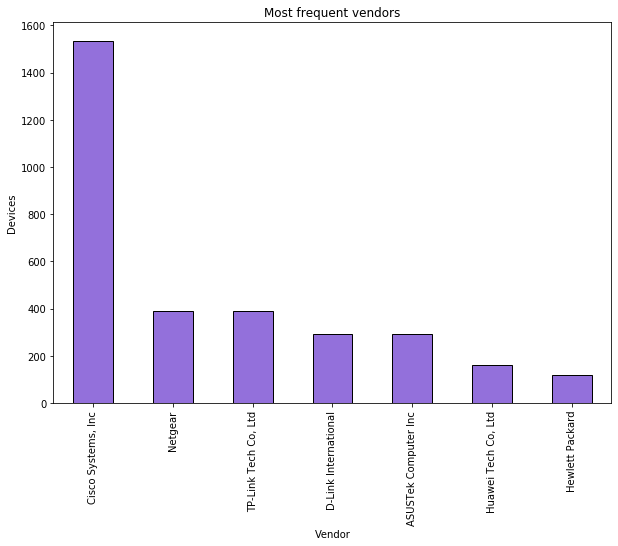

In [56]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt
import numpy as np



most_frequent_vendors.plot(kind='bar',figsize=(10,7), color="mediumpurple",edgecolor = "black")
plt.title('Most frequent vendors')
plt.xlabel('Vendor')
plt.ylabel('Devices')
plt.xticks(rotation=90)
plt.show()

In [61]:
wlan_processed_map = folium.Map(
            #tiles='Stamen Toner'
        )
for index,result in df_final.iterrows():
    tooltip = str(result.SSID)+" - "+str(result.MAC)
    """folium.Marker([result.CurrentLatitude, result.CurrentLongitude],
                  popup=(str(result.SSID)),
                  icon=folium.Icon(color='purple', icon='wifi'),
                  tooltip=tooltip).add_to(wlan_map)"""
    color = ""
    if "Cisco" in result.vendor:
        color = "cyan"
    elif "Netgear" in result.vendor:
        color = "green"
    elif "TP-Link" in result.vendor:
        color = "orange"
    elif "D-Link" in result.vendor:
        color = "white"
    elif "ASUSTek" in result.vendor:
        color = "blue"
    elif "Huawei" in result.vendor:
        color = "red"
    elif "Hewlett Packard" in result.vendor:
        color = "gray"
    else:
        color = "purple"
            
    folium.Circle(
        radius=3,
        location=[result.CurrentLatitude, result.CurrentLongitude],
        popup=(str(result.MAC)),
        color=color,
        fill=True,
        tooltip=(str(result.SSID))
    ).add_to(wlan_processed_map)

sw = data[['CurrentLatitude', 'CurrentLongitude']].min().values.tolist()
ne = data[['CurrentLatitude', 'CurrentLongitude']].max().values.tolist()
wlan_processed_map.fit_bounds([sw, ne]) 
display(wlan_processed_map)